In [1]:
%%HTML
<style>
.container {width:100% !important;}
</style>

In [2]:
import numpy as np
import kwant
import sys
sys.path.append('/home/bnijholt/orbitalfield/')
from fun import *
import holoviews as hv
%load_ext holoviews.ipython
%opts Image (cmap='jet')

# Share the workflow
* IPython Parallel
* ``HoloViews`` – my new favorite plotting tool
* Saving a lot of data – ``HDF5``
* ```*.ipynb```'s in ``git``

<center>
<img src="http://cdn.meme.am/instances/58014930.jpg" style="width:304px;height:228px;"></center>


# IPython parallel – why?
* Scalable
* Easy to use

# IPython parallel – core concepts


### 1. IPython engine

A Python kernel, **one engine per core**. 

### 2. IPython controller 

Interface for engines.
* Direct interface – assign the tasks by hand
* LoadBalanced interface – automatically distribute taksk

#IPython parallel – example

In [3]:
# First start the cluster!
from IPython.parallel import Client
client = Client()

# Direct interface:
dview = client[:]

# LoadBalanced interface:
lview = client.load_balanced_view()

In [4]:
print client.ids

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [5]:
len(client)  

10

#IPython parallel – example 
###Direct view, dview

In [6]:
x = np.arange(0, 50)
dview.scatter('x', x)
client[0]['x']

array([0, 1, 2, 3, 4])

In [7]:
%px x**2

Out[0:15]: array([ 0,  1,  4,  9, 16])

Out[1:15]: array([25, 36, 49, 64, 81])

Out[2:15]: array([100, 121, 144, 169, 196])

Out[3:15]: array([225, 256, 289, 324, 361])

Out[4:15]: array([400, 441, 484, 529, 576])

Out[5:15]: array([625, 676, 729, 784, 841])

Out[6:15]: array([ 900,  961, 1024, 1089, 1156])

Out[7:15]: array([1225, 1296, 1369, 1444, 1521])

Out[8:15]: array([1600, 1681, 1764, 1849, 1936])

Out[9:15]: array([2025, 2116, 2209, 2304, 2401])

In [8]:
%px res = x**2
res = dview.gather('res', block=True)
res

array([   0,    1,    4,    9,   16,   25,   36,   49,   64,   81,  100,
        121,  144,  169,  196,  225,  256,  289,  324,  361,  400,  441,
        484,  529,  576,  625,  676,  729,  784,  841,  900,  961, 1024,
       1089, 1156, 1225, 1296, 1369, 1444, 1521, 1600, 1681, 1764, 1849,
       1936, 2025, 2116, 2209, 2304, 2401])

#IPython parallel – example 
###lview

In [9]:
def f(x):
    return x**2
x = range(10)
map(f, x)

[0, 1, 4, 9, 16, 25, 36, 49, 64, 81]

In [10]:
x = range(10)
lview.map_sync(f, x)

[0, 1, 4, 9, 16, 25, 36, 49, 64, 81]

#IPython parallel – kwant

In [11]:
%%px
import kwant
import sys
sys.path.append('/home/bnijholt/orbitalfield/')
from fun import *
lead = make_3d_wire().finalized()
p = make_params(B_x=1, mu=7)

In [12]:
import numpy as np

def bands(k):
    return kwant.physics.Bands(lead, args=[p])(k)

momenta = np.linspace(-np.pi,   np.pi, 200)
energies = lview.map_sync(bands, momenta)

In [13]:
energies_ = np.array(energies)

# HoloViews – plotting 2.0

####complex visualizations made easy

Backend independent:
* matplotlib
* mpld3
* ...

In [14]:
import holoviews as hv
%load_ext holoviews.ipython

The holoviews.ipython extension is already loaded. To reload it, use:
  %reload_ext holoviews.ipython


In [15]:
rand = lambda i: np.random.rand(i, i)
rand(2)

array([[ 0.14127864,  0.58569326],
       [ 0.49233184,  0.7581098 ]])

:Image   [x,y]   (z)
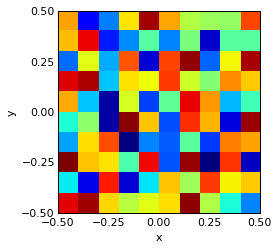

In [16]:
hv.Image(rand(10)) 

:Layout
   .Image.I   :Image   [x,y]   (z)
   .Image.II  :Image   [x,y]   (z)
   .Image.III :Image   [x,y]   (z)
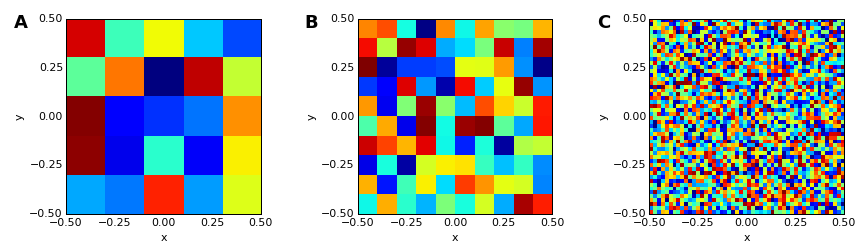

In [17]:
hv.Image(rand(5)) + hv.Image(rand(10)) + hv.Image(rand(50))

# Interactively scan your data with ``HoloMap`` 

In [18]:
dict_ims = {1: hv.Image(rand(1)), 
            2: hv.Image(rand(2)), 
            3: hv.Image(rand(3))}

:HoloMap   [Size]
   :Image   [x,y]   (z)
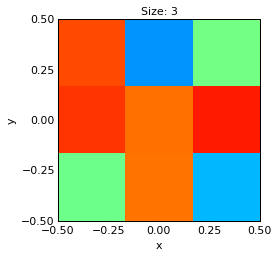
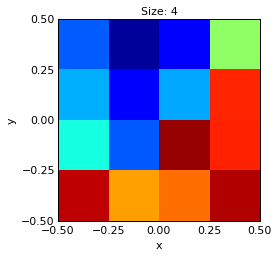
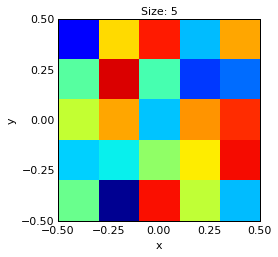
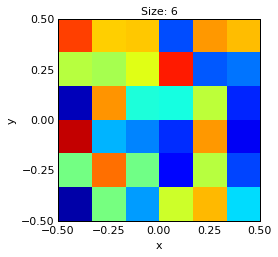
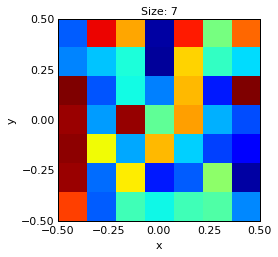
...
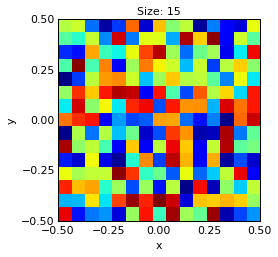
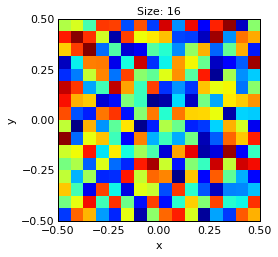
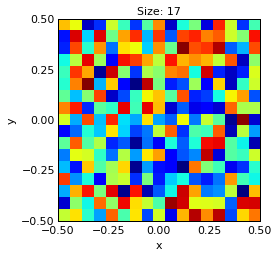
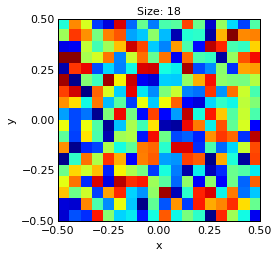
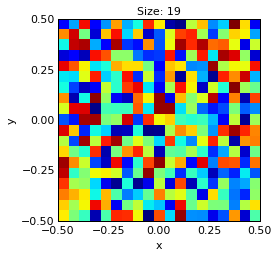

In [19]:
dict_ims = {i: hv.Image(rand(i)) for i in range(3, 20)}

hv.HoloMap(dict_ims, kdims=['Size'])

# Wavefunctions in an infinite wire

In [20]:
c.a = 3
lead = make_3d_wire().finalized()
p = make_params(B_x=1.44, B_y=0, mu=12.5)

def densities(lead, momentum, param):
    coord = np.array([lead.pos(i) for i in range(lead.graph.num_nodes)])
    xy = coord[coord[:, 0] == 0][:, 1:]
    h, t = lead.cell_hamiltonian(args=[p]), lead.inter_cell_hopping(args=[p])
    h_k = lambda k: h + t * np.exp(1j * k) + t.T.conj() * np.exp(-1j * k)

    vals, vecs = np.linalg.eigh(h_k(momentum))
    indxs = np.argsort(abs(vals))
    vecs = vecs[:, indxs]
    vals = vals[indxs]
    
    num_orbital = 4
    densities = np.linalg.norm(vecs.reshape(-1, num_orbital, len(vecs)), axis=1)**2
    return xy, vals, vecs, densities.T

xy, energies, vecs, densities = densities(lead, 0.1, p)
wfs = [kwant.plotter.mask_interpolate(xy, density, oversampling=1)[0] for density in densities][:40]

:HoloMap   [E]
   :Image   [x,y]   (z)
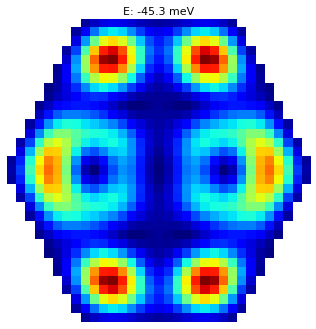
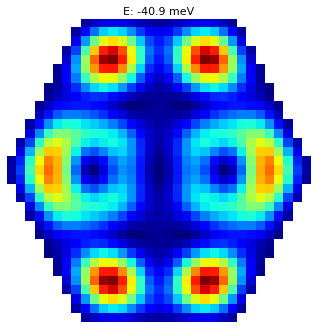
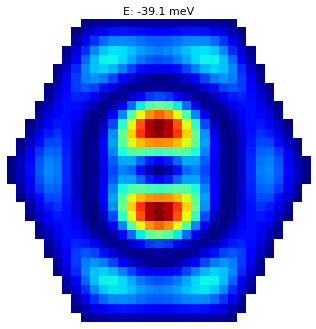
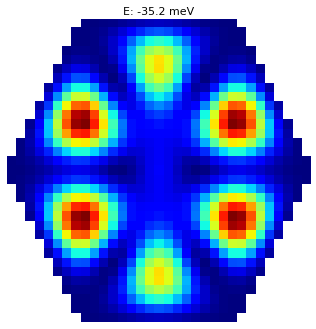
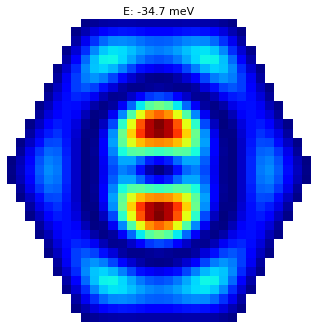
...
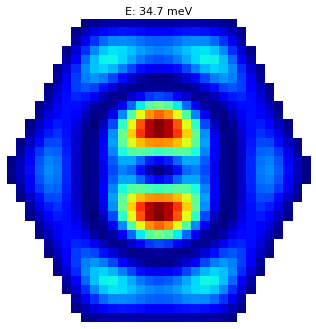
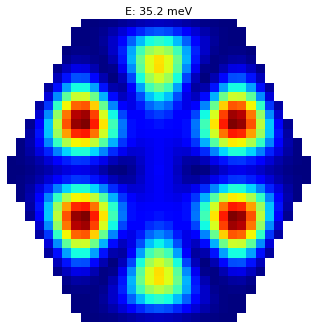
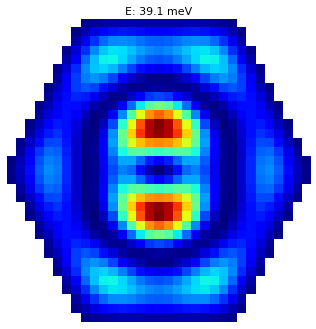
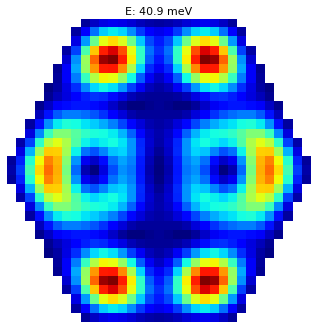
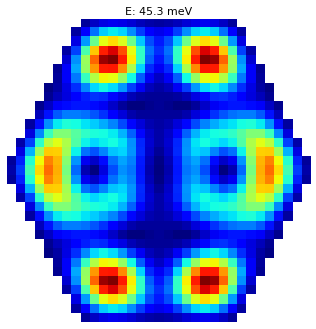

In [21]:
%%output size=150
%%opts Image {+framewise} (cmap='jet') [xaxis=None yaxis=None bgcolor='white']

ims = {E: hv.Image(wf) for E, wf in zip(energies, wfs)}
hv.HoloMap(ims, kdims=[hv.Dimension('E', unit='meV')])

In [22]:
def sine(x, phase=0, freq=1):
    return np.sin((freq * x + phase))

x = np.linspace(-3, 3, 150)
grid = x.reshape(-1, 1)**2 + x.reshape(1, -1)**2

image = hv.Image(sine(grid)) 

:Layout
   .AdjointLayout.I :AdjointLayout   [AdjointLayout]
      :Histogram   [z]   (Frequency)
   .Curve.I         :Curve   [y]   (z)
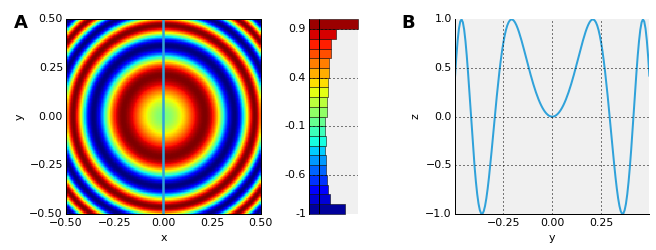

In [23]:
(image * hv.VLine(0)).hist(0) + image.sample(x=0)

## ``+`` to layout and ``*`` to overlay

:Layout
   .Overlay.I  :Overlay
      .Image.I :Image   [x,y]   (z)
      .VLine.I :VLine   [x,y]
   .Curve.I    :Curve   [y]   (z)
   .Overlay.II :Overlay
      .Image.I :Image   [x,y]   (z)
      .HLine.I :HLine   [x,y]
   .Curve.II   :Curve   [x]   (z)
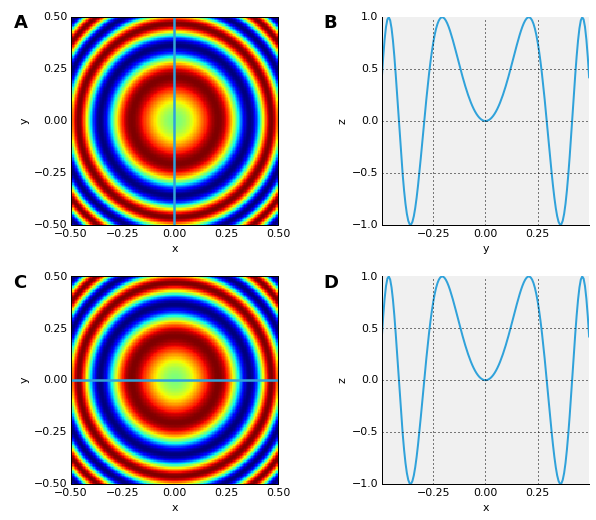

In [24]:
(image * hv.VLine(0) + image.sample(x=0) 
 + image * hv.HLine(0) + image.sample(y=0)).cols(2)

In [25]:
from itertools import product
# gap at:
k = k0 = 0.33780168183740172 
dk = 1.8374191057546341e-14
B = B0 = 1.4370450371523595 
dB = 1.0813572259849025e-13
Bs = np.linspace(-75*dB, 75*dB, 40)
ks = np.linspace(-50*dk, 50*dk, 40)

s1, s2 = (np.array([[-0.9810848434 -3.1146040317e-08j, -0.7502626115 -8.1382136438e-01j],
                    [-0.7502626248 +8.1382129245e-01j,  0.9810849724 +9.7630105654e-09j]]),
          np.array([[14.1893713282 +3.2277345327e-07j, 1.5980118197 -6.1060691094e-01j],
                    [1.5980119990 +6.1060693588e-01j, -14.1893716810 -4.1144106429e-08j]]))
H_eff = lambda B, k: s1 * B + s2 * k
cone_max = [np.linalg.eigvalsh(H_eff(B, k)).max() for B, k in product(Bs, ks)]
cone_max = np.rot90(np.reshape(cone_max, (len(Bs), len(ks))))

# Add dimensions

:Layout
   .Overlay.I  :Overlay
      .Image.I :Image   [B,k]   (E)
      .VLine.I :VLine   [x,y]
   .Curve.I    :Curve   [k]   (E)
   .Overlay.II :Overlay
      .Image.I :Image   [B,k]   (E)
      .HLine.I :HLine   [x,y]
   .Curve.II   :Curve   [B]   (E)
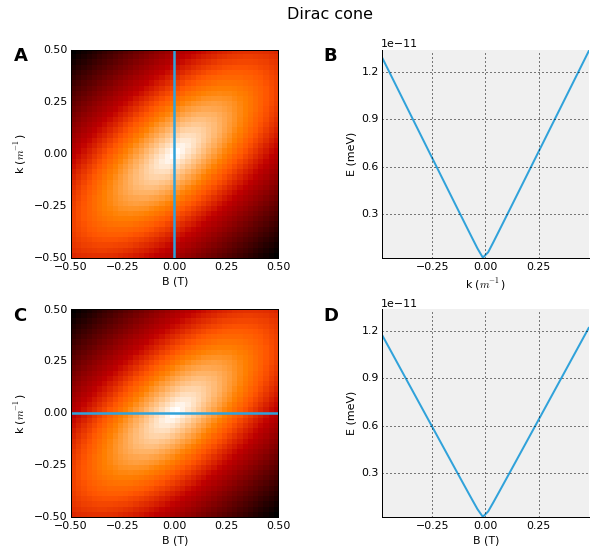

In [26]:
%%opts Image (cmap='gist_heat_r')

# Dimensions
B = hv.Dimension('B', unit='T')
k = hv.Dimension('k', unit=r'$m^{-1}$')
E = hv.Dimension('E', unit='meV')

im = hv.Image(cone_max, kdims=[B, k], vdims=[E])

(im * hv.VLine(0) + im.sample(B=0)
+im * hv.HLine(0) + im.sample(k=0)).relabel("Dirac cone").cols(2)

In [27]:
from tools import SimpleNamespace

In [28]:
# because I often reuse dimensions, I put it in a SimpleNamespace
d = SimpleNamespace(B=hv.Dimension(name='B', unit='T'),
                    mu=hv.Dimension(name='Chemical potential', unit='meV'),
                    gap=hv.Dimension(name='Band gap', unit='meV'),
                    decay_length= hv.Dimension(name='Inverse decay length', unit=r'$\mu m^{-1}$'),
                    k=hv.Dimension(name='Momentum', unit=r'nm$^-1$'),
                    E=hv.Dimension(name='Energy', unit='meV'),
                    delta=hv.Dimension(name='Superconducting gap', unit='mev'))

# GridSpaces

In [29]:
hm = hv.HoloMap(kdims=[d.E, 'Wavefunction', 'Component'], label=("Four compontent of the wavefunction for the ~0 energies wavefunctions"))

components = [r"$\left|\uparrow,-e\right\rangle$", 
              r"$\left|\uparrow,e\right\rangle$", 
              r"$\left|\downarrow,-e\right\rangle$", 
              r"$\left|\downarrow,e\right\rangle$"]

for i in range(50):
    wf1 = vecs[:, 2*i].reshape((-1, 4))
    wf2 = vecs[:, 2*i + 1].reshape((-1, 4))
    energy = np.abs(energies[2*i])
    for j, component in enumerate(components):
        for sign, wf in zip(['-E', '+E'], [wf1, wf2]):
            mask = kwant.plotter.mask_interpolate(xy, wf[:, j] * wf[:, j].conj(), oversampling=1)[0]
            hm[energy, sign, component] = hv.Image(np.abs(mask))

:GridSpace   [Wavefunction,Component]
   :HoloMap   [Energy]
      :Image   [x,y]   (z)
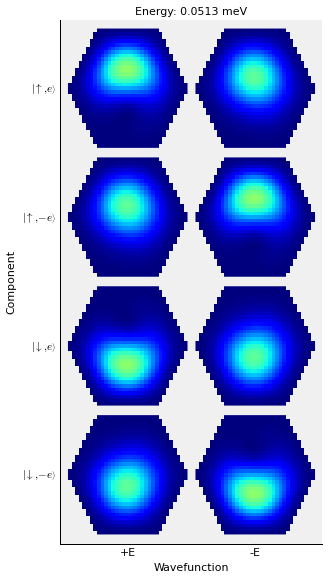
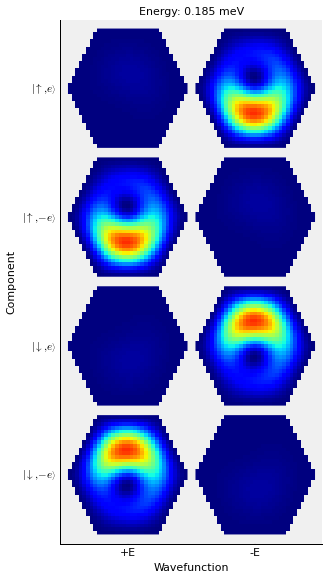
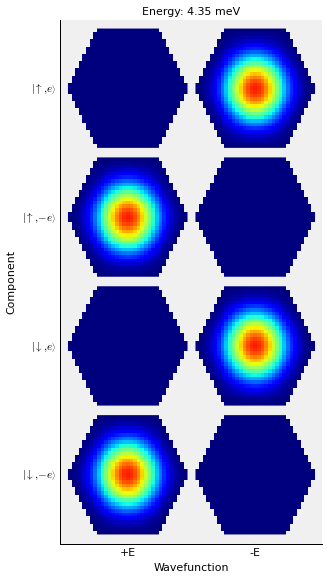
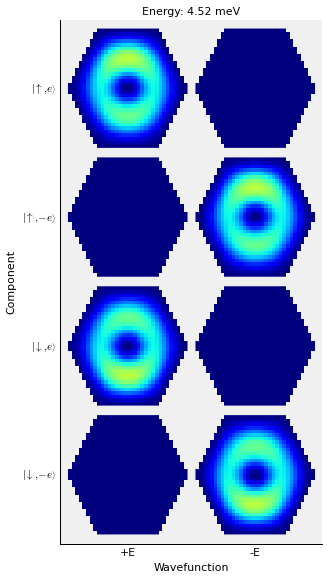
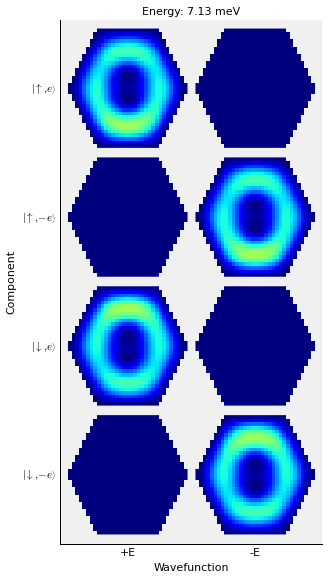
...
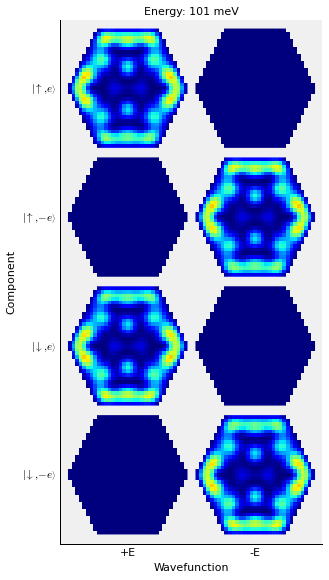
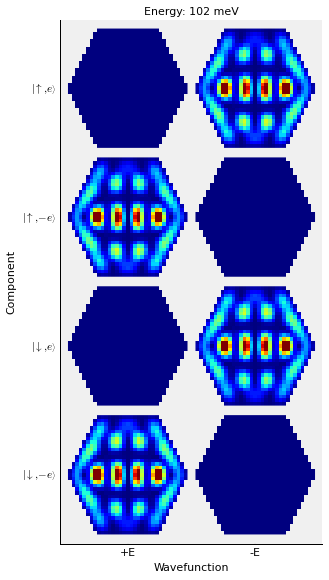
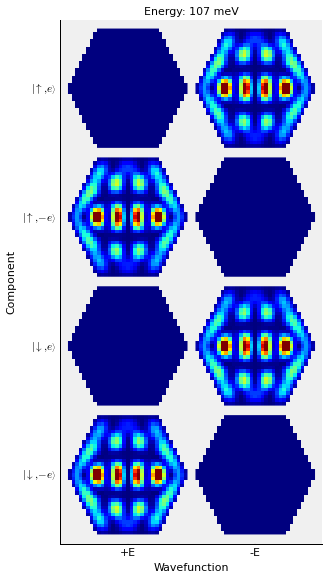
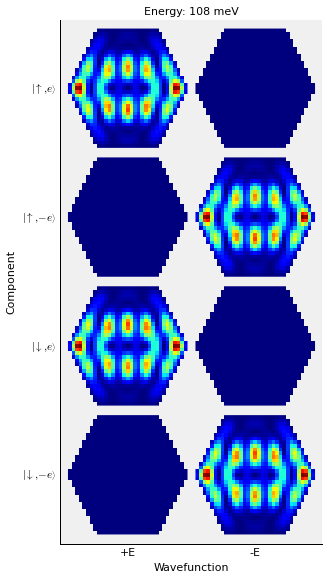
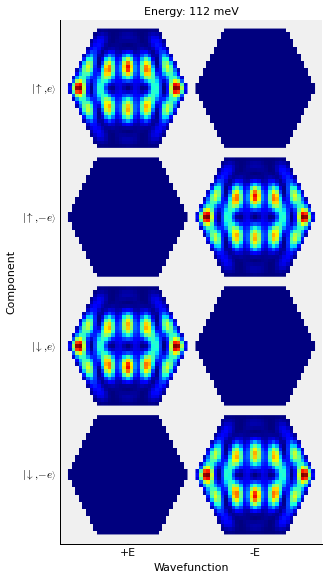

In [30]:
%%output size=200 
%%opts Image (cmap='jet') {+framewise}
hm.grid(['Wavefunction', 'Component'])

In [31]:
Bs, thetas, phis, mu_mesh, mus_output, pos, mus, vals, mask, gaps_output, gaps, decay_length_output, decay_length = load_data('/home/bnijholt/orbitalfield/data/0_to_2T_10x10_angles.h5', rot=True)
gap = gaps[-1,0]

# Some of my data

In [32]:
# I just loaded some data
gap.shape

(400, 400)

:Image   [x,y]   (z)
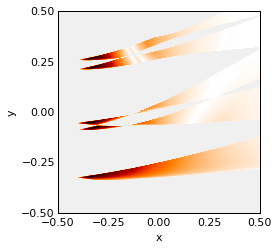

In [33]:
%opts Image (cmap='gist_heat_r')
hv.Image(gap)

:Image   [B,Chemical potential]   (z)
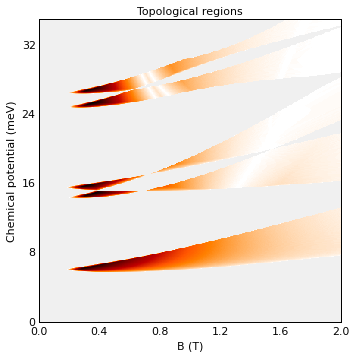

In [34]:
%%output size=150
topo = hv.Image(gap, 
                kdims=[d.B, d.mu], 
                bounds=(0, 0, 2, 35),  
                label=("Topological regions"))
topo

:Image   [B,Chemical potential]   (z)
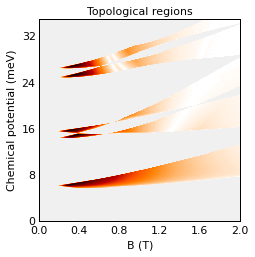

In [35]:
type(topo.data), topo.data.shape
topo

In [36]:
topo.data

array([[        nan,         nan,         nan, ...,  0.00041469,
         0.0004045 ,  0.00039431],
       [        nan,         nan,         nan, ...,  0.00037196,
         0.00036177,  0.00035158],
       [        nan,         nan,         nan, ...,  0.00032924,
         0.00031905,  0.00030886],
       ..., 
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])

# Example of my data

In [37]:
ims = create_holoviews('/home/bnijholt/orbitalfield/data/0_to_2T_10x10_angles.h5')

In [38]:
ims.keys()

['decay_lengths_bounds',
 'gaps_bounds',
 'topo_bounds',
 'sphere',
 'gaps',
 'decay_lengths']

In [39]:
ims['gaps'].values()

[:Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,Chemical potential]   (Band gap),
 :Image   [B,

:Layout
   .Image.Band_gaps_left_parenthesis_meV_right_parenthesis :Image   [B,Chemical potential]   (Band gap)
   .Topological_boundaries.I                               :Path   [B,Chemical potential]
   .Overlay.I                                              :Overlay
      .Image.Band_gaps_left_parenthesis_meV_right_parenthesis :Image   [B,Chemical potential]   (Band gap)
      .Topological_boundaries.I                               :Path   [B,Chemical potential]
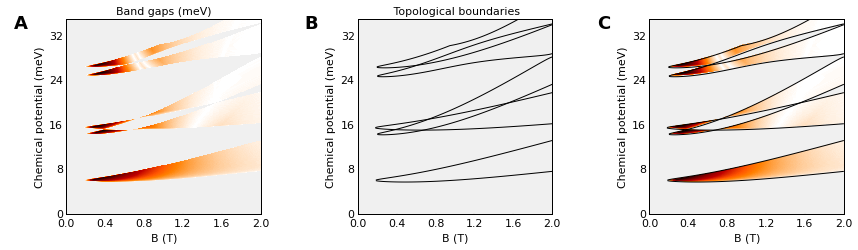

In [40]:
(  ims['gaps'][0, 0] 
 + ims['topo_bounds'][0, 0] 
 + ims['gaps'][0, 0] * ims['topo_bounds'][0, 0])

# Easily select a part of the image
Independent of resolution of the image!

:Layout
   .Overlay.I                                              :Overlay
      .Image.Band_gaps_left_parenthesis_meV_right_parenthesis :Image   [B,Chemical potential]   (Band gap)
      .Bounds.I                                               :Bounds   [x,y]
   .Image.Band_gaps_left_parenthesis_meV_right_parenthesis :Image   [B,Chemical potential]   (Band gap)
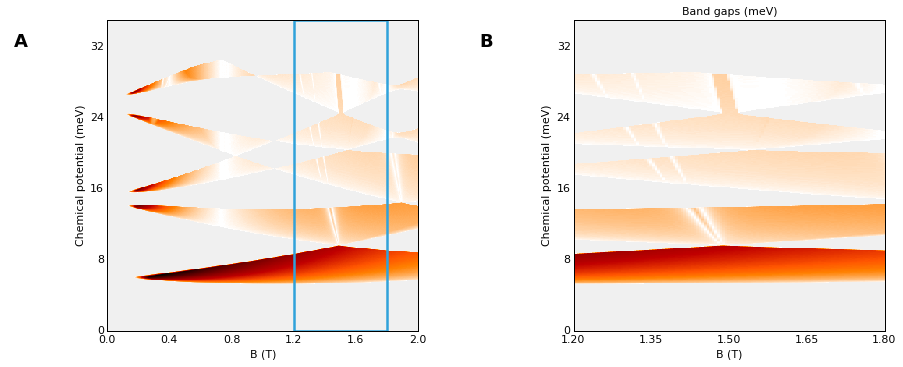

In [41]:
%%output size=150
lines = ims['gaps'][0.5, 0]

lines * hv.Bounds((1.2, 0, 1.8, 35)) + lines.select(B=(1.2, 1.8))

# Different backend's 

In [42]:
%%output backend='d3' size=200
hv.Path((momenta, energies_)).relabel("Band structure")

:Path   [x,y]

# h5py - saving your data
###HDF5 format save easily handle GB's of data

In [43]:
import h5py
import numpy as np
f = h5py.File("mytestfile.hdf5", "w")

In [44]:
dset = f.create_dataset("mydataset", (100,), dtype='i')   

In [45]:
# like an numpy array, but without data.
dset.shape, dset.dtype

((100,), dtype('int32'))

In [46]:
dset[:] = np.arange(0, 100)

In [47]:
dset[0:100:10] 

array([ 0, 10, 20, 30, 40, 50, 60, 70, 80, 90], dtype=int32)

# HDF5: Hierarchical Data Format 

In [48]:
parameters = f.create_group('parameter_folder')

In [49]:
f.create_dataset('parameter_folder/B', data=1.2)
parameters.create_dataset('E', data=100) 

<HDF5 dataset "E": shape (), type "<i8">

In [50]:
f.close() 

# Loading existing data

In [51]:
f = h5py.File("/home/bnijholt/orbitalfield/data/0_to_1T_5_to_9meV_2x2_angles.h5", "r")

In [52]:
f.items()

[(u'Bs', <HDF5 dataset "Bs": shape (400,), type "<f8">),
 (u'decay_length_output',
  <HDF5 dataset "decay_length_output": shape (640000,), type "<f8">),
 (u'gaps_output', <HDF5 dataset "gaps_output": shape (640000,), type "<f8">),
 (u'mu_mesh', <HDF5 dataset "mu_mesh": shape (400,), type "<f8">),
 (u'mus_output', <HDF5 dataset "mus_output": shape (1600, 20), type "<c16">),
 (u'parameters', <HDF5 group "/parameters" (18 members)>),
 (u'phis', <HDF5 dataset "phis": shape (2,), type "<f8">),
 (u'thetas', <HDF5 dataset "thetas": shape (2,), type "<f8">)]

In [53]:
f['Bs']

<HDF5 dataset "Bs": shape (400,), type "<f8">

In [54]:
f['Bs'][:20]

array([ 0.        ,  0.00250627,  0.00501253,  0.0075188 ,  0.01002506,
        0.01253133,  0.01503759,  0.01754386,  0.02005013,  0.02255639,
        0.02506266,  0.02756892,  0.03007519,  0.03258145,  0.03508772,
        0.03759398,  0.04010025,  0.04260652,  0.04511278,  0.04761905])

In [55]:
f['parameters']

<HDF5 group "/parameters" (18 members)>

In [56]:
params = f['parameters']
params.items()

[(u'B_x', <HDF5 dataset "B_x": shape (), type "<i8">),
 (u'B_y', <HDF5 dataset "B_y": shape (), type "<i8">),
 (u'B_z', <HDF5 dataset "B_z": shape (), type "<i8">),
 (u'a', <HDF5 dataset "a": shape (), type "<i8">),
 (u'alpha', <HDF5 dataset "alpha": shape (), type "<i8">),
 (u'delta', <HDF5 dataset "delta": shape (), type "<f8">),
 (u'e', <HDF5 dataset "e": shape (), type "<f8">),
 (u'eV', <HDF5 dataset "eV": shape (), type "<f8">),
 (u'g', <HDF5 dataset "g": shape (), type "<i8">),
 (u'hbar', <HDF5 dataset "hbar": shape (), type "<f8">),
 (u'm', <HDF5 dataset "m": shape (), type "<f8">),
 (u'm_e', <HDF5 dataset "m_e": shape (), type "<f8">),
 (u'meV', <HDF5 dataset "meV": shape (), type "<f8">),
 (u'mu', <HDF5 dataset "mu": shape (), type "<i8">),
 (u'mu_B', <HDF5 dataset "mu_B": shape (), type "<f8">),
 (u'orbital', <HDF5 dataset "orbital": shape (), type "|b1">),
 (u't', <HDF5 dataset "t": shape (), type "<f8">),
 (u'zeeman', <HDF5 dataset "zeeman": shape (), type "|b1">)]

In [57]:
params['hbar'].value

1.0545717253362894e-34

# Write some functions to do the work

In [58]:
# %load -n save_data
def save_data(fname, Bs, thetas, phis, mu_mesh, mus_output, gaps_output,
              decay_length_output, p,
              c=c):
    """
    Saves data to h5f format.
    """
    if os.path.isfile(fname):
        print('File already exists.')
    else:
        h5f = h5py.File(fname, 'w')
        h5f.create_dataset('Bs', data=Bs)
        h5f.create_dataset('thetas', data=thetas)
        h5f.create_dataset('phis', data=phis)
        h5f.create_dataset('mu_mesh', data=mu_mesh)
        h5f.create_dataset('mus_output',
                           data=mus_output,
                           compression="gzip",
                           compression_opts=9)
        h5f.create_dataset('gaps_output',
                           data=gaps_output,
                           compression="gzip",
                           compression_opts=9)
        h5f.create_dataset('decay_length_output',
                           data=decay_length_output,
                           compression="gzip",
                           compression_opts=9)

        parameters = {k: v for k, v in vars(c).items() + vars(p).items()}
        for k, v in parameters.items():
            if isinstance(v, int) or isinstance(v, float):
                h5f.create_dataset('parameters/' + k, data=v)
        h5f.close()

In [59]:
# %load -n load_data
def load_data(fname, rot=False):
    """
    Loads data from h5py file.
    """
    h5f = h5py.File(fname, 'r')
    Bs = h5f['Bs'][:]
    thetas = h5f['thetas'][:]
    phis = h5f['phis'][:]
    mu_mesh = h5f['mu_mesh'][:]
    mus_output = h5f['mus_output'][:]
    gaps_output = h5f['gaps_output'][:]
    decay_length_output = h5f['decay_length_output'][:]
    h5f.close()
    pos = spherical_coordinates(
        Bs.reshape(-1, 1, 1), thetas.reshape(1, -1, 1), phis.reshape(1, 1, -1))
    mus, vals, mask = create_mask(Bs, thetas, phis, mu_mesh, mus_output)

    gaps = np.array(gaps_output).reshape(mask.shape)
    gaps[1:, 0] = gaps[0, 0]

    decay_length = np.array(decay_length_output).reshape(mask.shape)
    decay_length[1:, 0] = decay_length[0, 0]

    if rot:
        for i, j in product(range(gaps.shape[0]), range(gaps.shape[1])):
            gaps[i, j] = np.rot90(gaps[i, j])
            decay_length[i, j] = np.rot90(decay_length[i, j])

    return Bs, thetas, phis, mu_mesh, mus_output, pos, mus, vals, mask, gaps_output, gaps, decay_length_output, decay_length

# Much more
* Giving your array's dimensions
* store metadata in attributes
* Parallel writing and reading

# IPython notebook ``output`` in ``.git``

* Why not?

In [60]:
# !wget https://raw.githubusercontent.com/topocm/topocm_content/master/w10_extensions/gapless.ipynb
# !cat "gapless.ipynb"

#  How to solve?

``cd`` to your repo.

Download the file with:

```bash
wget https://raw.githubusercontent.com/toobaz/ipynb_output_filter/master/ipynb_output_filter.py
```
  
Create a file:
```bash
nano .gitattributes
```
  
add this line:

```bash
*.ipynb    filter=dropoutput_ipynb
```
Then execute the following lines:
```python
git config core.attributesfile ~/myrepo/.gitattributes
git config filter.dropoutput_ipynb.clean python ~/myrepo/script/ipynb_output_filter.py
git config filter.dropoutput_ipynb.smudge cat
```

Or go to the Wiki:
https://meso.tnw.tudelft.nl/wiki/git-ipynb